# DATASET INFORMATION

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

In [1]:
#Importing all gthe needed libraries

import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
from sklearn.model_selection import train_test_split

In [2]:
#Importing the dataset storing it into df & printing it

df=pd.read_csv('INSURANCE-PROJECT.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
#Printing the first five rows of the dataset

df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
#Printing the last five rows of the dataset

df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [5]:
#Printing a sample row from the dataset

df.sample()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
343,334,47,156694,24-05-2001,IL,500/1000,500,1238.89,0,600561,...,NO,6240,960,960,4320,Ford,Fusion,2011,N,NaN


In [6]:
#Printing the datatypes of each column that is present in the dataset

df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [7]:
#Getting the information about the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [8]:
#Printing the skewness present in the dataset

df.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
_c39                                NaN
dtype: float64

In [9]:
#Printing the shape of the dataset

df.shape

(1000, 40)

In [10]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [11]:
#Droping the column

df = df.drop(['_c39'], axis =1)

In [12]:
#Printing the dataframe

df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [13]:
#Splitting the date

df[["day", "Month", "Year"]] = df['policy_bind_date'].str.split("-", expand=True)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,day,Month,Year
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,6510,13020,52080,Saab,92x,2004,Y,17,10,2014
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,780,780,3510,Mercedes,E400,2007,Y,27,06,2006
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,7700,3850,23100,Dodge,RAM,2007,N,06,09,2000
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,6340,6340,50720,Chevrolet,Tahoe,2014,Y,25,05,1990
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1300,650,4550,Accura,RSX,2009,N,06,06,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,17440,8720,61040,Honda,Accord,2006,N,16,07,1991
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,18080,18080,72320,Volkswagen,Passat,2015,N,05,01,2014
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,7500,7500,52500,Suburu,Impreza,1996,N,17,02,2003
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,5220,5220,36540,Audi,A5,1998,N,18,11,2011


In [14]:
df[["incident_day", "incident_month", "incident_year"]] = df['incident_date'].str.split("-", expand = True)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,auto_make,auto_model,auto_year,fraud_reported,day,Month,Year,incident_day,incident_month,incident_year
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,Saab,92x,2004,Y,17,10,2014,25,01,2015
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,Mercedes,E400,2007,Y,27,06,2006,21,01,2015
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,Dodge,RAM,2007,N,06,09,2000,22,02,2015
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,Chevrolet,Tahoe,2014,Y,25,05,1990,10,01,2015
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,Accura,RSX,2009,N,06,06,2014,17,02,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,Honda,Accord,2006,N,16,07,1991,22,02,2015
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,Volkswagen,Passat,2015,N,05,01,2014,24,01,2015
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,Suburu,Impreza,1996,N,17,02,2003,23,01,2015
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,Audi,A5,1998,N,18,11,2011,26,02,2015


In [15]:
df = df.drop(['policy_bind_date', 'incident_date'], axis=1)
df

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,auto_make,auto_model,auto_year,fraud_reported,day,Month,Year,incident_day,incident_month,incident_year
0,328,48,521585,OH,250/500,1000,1406.91,0,466132,MALE,...,Saab,92x,2004,Y,17,10,2014,25,01,2015
1,228,42,342868,IN,250/500,2000,1197.22,5000000,468176,MALE,...,Mercedes,E400,2007,Y,27,06,2006,21,01,2015
2,134,29,687698,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,Dodge,RAM,2007,N,06,09,2000,22,02,2015
3,256,41,227811,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,Chevrolet,Tahoe,2014,Y,25,05,1990,10,01,2015
4,228,44,367455,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,Accura,RSX,2009,N,06,06,2014,17,02,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,OH,500/1000,1000,1310.80,0,431289,FEMALE,...,Honda,Accord,2006,N,16,07,1991,22,02,2015
996,285,41,186934,IL,100/300,1000,1436.79,0,608177,FEMALE,...,Volkswagen,Passat,2015,N,05,01,2014,24,01,2015
997,130,34,918516,OH,250/500,500,1383.49,3000000,442797,FEMALE,...,Suburu,Impreza,1996,N,17,02,2003,23,01,2015
998,458,62,533940,IL,500/1000,2000,1356.92,5000000,441714,MALE,...,Audi,A5,1998,N,18,11,2011,26,02,2015


# ENCODING

In [16]:
#Importing LabelEncoder for encoding the columns

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [17]:
le.fit(df['policy_state'].drop_duplicates())
le.classes_
df['policy_state'] = le.transform(df['policy_state'])

In [18]:
le.fit(df['policy_csl'].drop_duplicates())
le.classes_
df['policy_csl'] = le.transform(df['policy_csl'])

In [19]:
le.fit(df['insured_sex'].drop_duplicates())
le.classes_
df['insured_sex'] = le.transform(df['insured_sex'])

In [20]:
le.fit(df['insured_education_level'].drop_duplicates())
le.classes_
df['insured_education_level'] = le.transform(df['insured_education_level'])

In [21]:
le.fit(df['insured_occupation'].drop_duplicates())
le.classes_
df['insured_occupation'] = le.transform(df['insured_occupation'])

In [22]:
le.fit(df['insured_hobbies'].drop_duplicates())
le.classes_
df['insured_hobbies'] = le.transform(df['insured_hobbies'])

In [23]:
le.fit(df['fraud_reported'].drop_duplicates())
le.classes_
df['fraud_reported'] = le.transform(df['fraud_reported'])

In [24]:
le.fit(df['insured_relationship'].drop_duplicates())
le.classes_
df['insured_relationship'] = le.transform(df['insured_relationship'])

In [25]:
le.fit(df['incident_type'].drop_duplicates())
le.classes_
df['incident_type'] = le.transform(df['incident_type'])

In [26]:
le.fit(df['collision_type'].drop_duplicates())
le.classes_
df['collision_type'] = le.transform(df['collision_type'])

In [27]:
le.fit(df['incident_severity'].drop_duplicates())
le.classes_
df['incident_severity'] = le.transform(df['incident_severity'])

In [28]:
le.fit(df['authorities_contacted'].drop_duplicates())
le.classes_
df['authorities_contacted'] = le.transform(df['authorities_contacted'])

In [29]:
le.fit(df['incident_state'].drop_duplicates())
le.classes_
df['incident_state'] = le.transform(df['incident_state'])

In [30]:
le.fit(df['incident_city'].drop_duplicates())
le.classes_
df['incident_city'] = le.transform(df['incident_city'])

In [31]:
le.fit(df['incident_location'].drop_duplicates())
le.classes_
df['incident_location'] = le.transform(df['incident_location'])

In [32]:
le.fit(df['property_damage'].drop_duplicates())
le.classes_
df['property_damage'] = le.transform(df['property_damage'])

In [33]:
le.fit(df['police_report_available'].drop_duplicates())
le.classes_
df['police_report_available'] = le.transform(df['police_report_available'])

In [34]:
le.fit(df['auto_make'].drop_duplicates())
le.classes_
df['auto_make'] = le.transform(df['auto_make'])

In [35]:
le.fit(df['auto_model'].drop_duplicates())
le.classes_
df['auto_model'] = le.transform(df['auto_model'])

# DATA VISUALIZATION

# UNIVARIET ANALYSIS

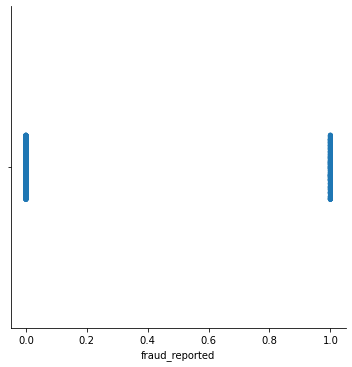

In [36]:
#Plotting catplot of our target variable

sns.catplot(data=df,x='fraud_reported')

<AxesSubplot:xlabel='fraud_reported', ylabel='Density'>

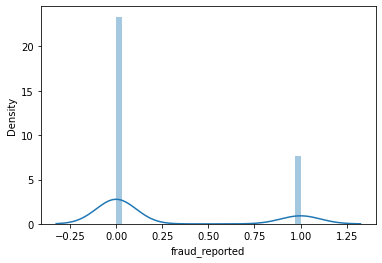

In [37]:
#Plotting distribution plot of our target variable

sns.distplot(df['fraud_reported'])

<AxesSubplot:xlabel='fraud_reported'>

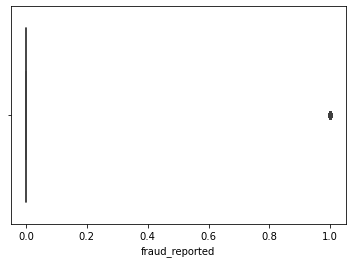

In [38]:
#There is an outlier in our target variable

sns.boxplot(data=df,x='fraud_reported')

<AxesSubplot:xlabel='fraud_reported'>

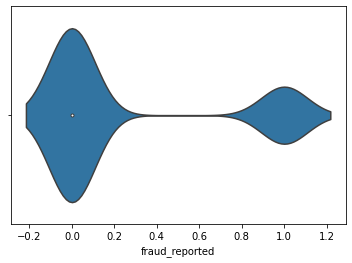

In [39]:
#Violin plot shows how much our target variable is concentrated 

sns.violinplot(df['fraud_reported'])

<AxesSubplot:xlabel='fraud_reported', ylabel='Count'>

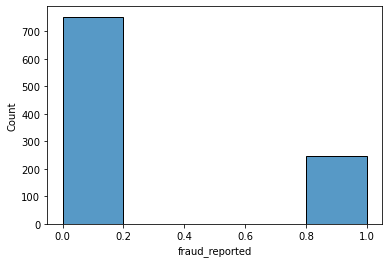

In [40]:
#Plotting histogram of our target variable

sns.histplot(df['fraud_reported'],bins=5)

# BI-VARIET ANALYSIS

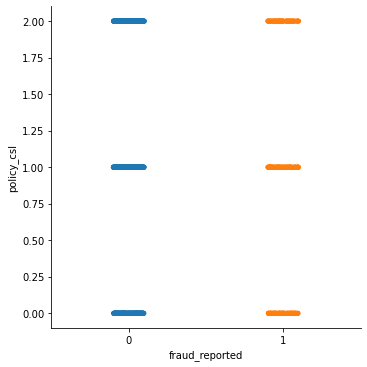

In [41]:
#Plotting catplot of 2 columns fraud_reported & policy _csl

sns.catplot(x='fraud_reported',y='policy_csl',data=df)

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_csl'>

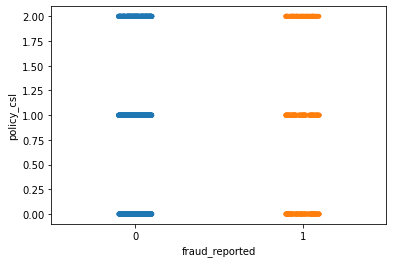

In [42]:
#Plotting striplot of the columns

sns.stripplot(x='fraud_reported',y='policy_csl',data=df)

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_csl'>

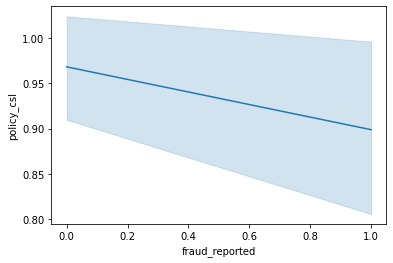

In [43]:
#They shows a -ve relationship we are plotting LinePlot here

sns.lineplot(x='fraud_reported',y='policy_csl',data=df)

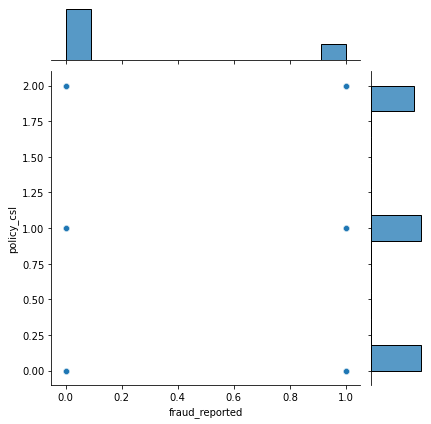

In [44]:
#Plotting the jointplot of the columns

sns.jointplot(x=df['fraud_reported'],y=df['policy_csl'],data=df)

# MULTIVARIET ANALYSIS

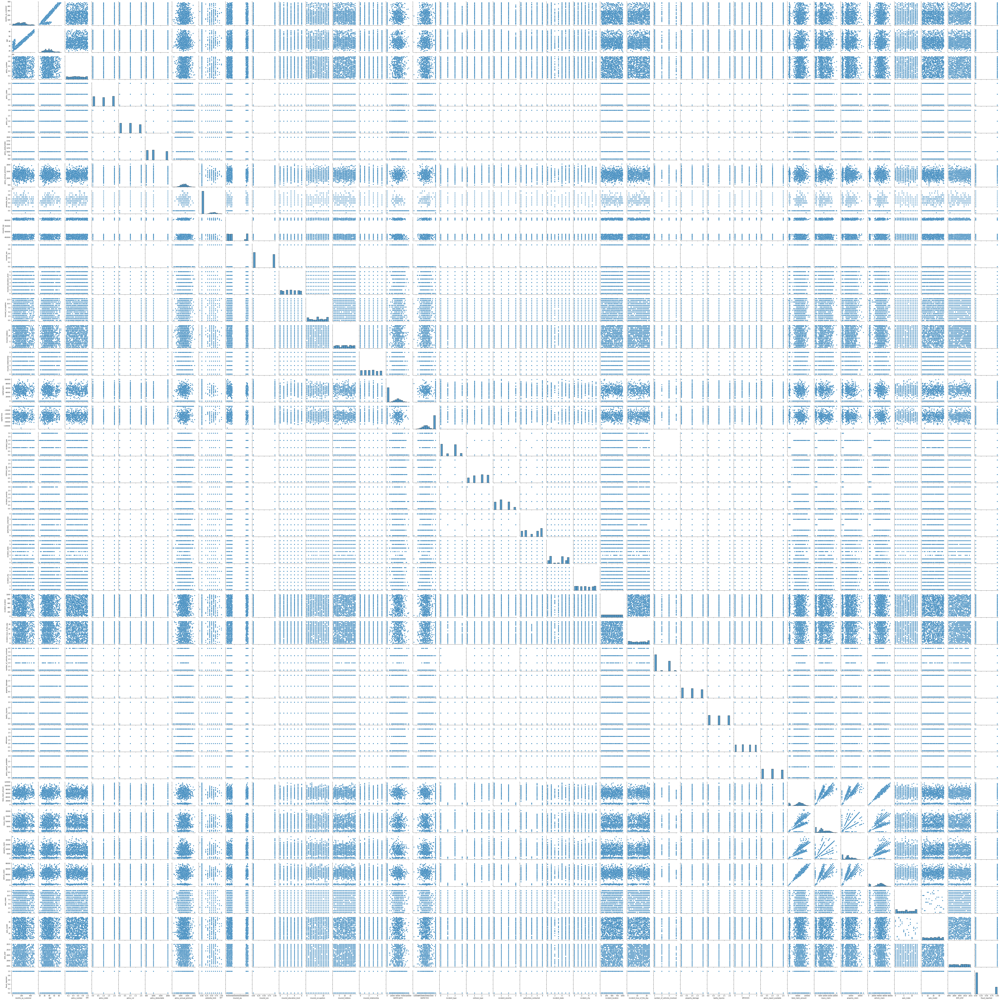

In [45]:
#Plotting all the graphs showing relationship of each other 

sns.pairplot(df)

# CORELATION

In [46]:
#Printing the corelation of the columns

df.corr()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,0.057555,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,...,0.058383,0.017647,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544
age,0.922098,1.000000,0.059413,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,...,0.052359,0.014661,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143
policy_number,0.057555,0.059413,1.000000,0.072815,0.038917,-0.006738,0.022566,0.008968,0.007083,0.004564,...,-0.012661,0.032019,-0.018009,-0.008762,-0.010678,-0.020184,0.023860,0.065240,-0.000183,-0.029443
policy_state,-0.000328,-0.014533,0.072815,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,-0.020481,...,0.022960,0.071950,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432
policy_csl,-0.026819,-0.015185,0.038917,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,...,0.071500,0.002424,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190
policy_deductable,0.026807,0.029188,-0.006738,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,...,0.066639,0.030166,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817
policy_annual_premium,0.005018,0.014404,0.022566,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,...,0.002332,0.013624,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480
umbrella_limit,0.015498,0.018126,0.008968,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,...,-0.006738,-0.055951,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622
insured_zip,0.017895,0.025604,0.007083,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,-0.036942,...,0.019805,-0.017607,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368
insured_sex,0.060925,0.073337,0.004564,-0.020481,-0.010757,-0.009733,0.038853,0.010688,-0.036942,1.000000,...,0.042463,0.020864,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873


# DIVIDING X & Y

In [47]:
#Dividing all the features variables & target variables differently

x = df.drop(["fraud_reported", "insured_relationship"], axis=1)
y = df['fraud_reported']

# SKEWNESS

In [48]:
#Printing the skewness present in the feature variables

x.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.106418


In [49]:
#Removing skewness power_transform

from sklearn.preprocessing import power_transform
df_new = power_transform(x)
df_new = pd.DataFrame(df_new, columns = x.columns)

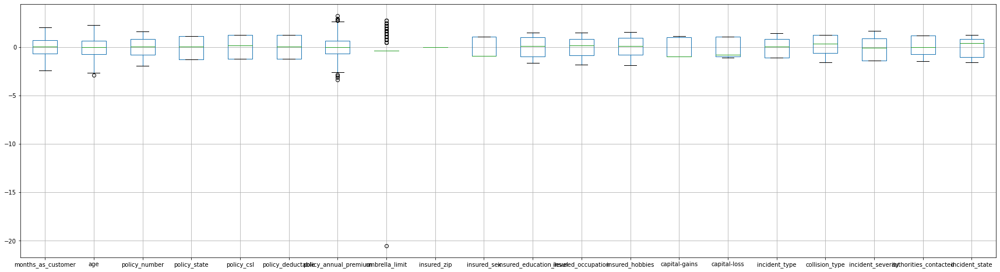

In [51]:
#Printing the boxplots of all the column

import matplotlib.pyplot as plt
df_new.iloc[:,0:20].boxplot(figsize=[30,8])
plt.subplots_adjust()
plt.show()

# HANDLING OVERSAMPLING

In [52]:
#Applying SMOTE

from imblearn.over_sampling import SMOTE
sm = SMOTE()
x_over, y_over = sm.fit_resample(x, y)

In [53]:
#Making equal 

y_over.value_counts()

0    753
1    753
Name: fraud_reported, dtype: int64

# FINDING BEST ACCURACY

In [55]:
#Finding the best accuracy

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
maxAccu = 0
maxRS = 0

for i in range (1,200):
    x_train, x_test, y_train, y_test = train_test_split(x_over,y_over,test_size=0.25,random_state=i)
    LR = LogisticRegression()
    LR.fit(x_train,y_train)
    predlr = LR.predict(x_test)
    acc = accuracy_score(y_test, predlr)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
        
print('The best accuracy is ',maxAccu, ' on Random_State ',maxRS)

The best accuracy is  0.6312997347480106  on Random_State  62


In [56]:
#Sending the data for training & testing

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_over,y_over, test_size=0.25, random_state=62)

# MODELS

# LR

In [57]:
#Importing LogisticRegression

from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()

LR.fit(x_train,y_train)
predlr = LR.predict(x_test)

print(accuracy_score(y_test, predlr))
print(confusion_matrix(y_test, predlr))
print(classification_report(y_test, predlr))

0.6312997347480106
[[115  91]
 [ 48 123]]
              precision    recall  f1-score   support

           0       0.71      0.56      0.62       206
           1       0.57      0.72      0.64       171

    accuracy                           0.63       377
   macro avg       0.64      0.64      0.63       377
weighted avg       0.65      0.63      0.63       377



# RANDOM FOREST CLASSIFIER

In [58]:
#Importing RandomForestClassifier

from sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier()

RF.fit(x_train, y_train)
predrf = RF.predict(x_test)

print(accuracy_score(y_test, predrf))
print(confusion_matrix(y_test, predrf))
print(classification_report(y_test, predrf))

0.9098143236074271
[[188  18]
 [ 16 155]]
              precision    recall  f1-score   support

           0       0.92      0.91      0.92       206
           1       0.90      0.91      0.90       171

    accuracy                           0.91       377
   macro avg       0.91      0.91      0.91       377
weighted avg       0.91      0.91      0.91       377



# DECISION TREE CLASSIFIER

In [59]:
#Importing Decision Tree

from sklearn.tree import DecisionTreeClassifier
DT = DecisionTreeClassifier()

DT.fit(x_train, y_train)
preddt = DT.predict(x_test)

print(accuracy_score(y_test, preddt))
print(confusion_matrix(y_test, preddt))
print(classification_report(y_test, preddt))

0.8090185676392573
[[167  39]
 [ 33 138]]
              precision    recall  f1-score   support

           0       0.83      0.81      0.82       206
           1       0.78      0.81      0.79       171

    accuracy                           0.81       377
   macro avg       0.81      0.81      0.81       377
weighted avg       0.81      0.81      0.81       377



# SVC

In [60]:
#Importing SVC

from sklearn.svm import SVC
svc = SVC()

svc.fit(x_train, y_train)
predsv = svc.predict(x_test)

print(accuracy_score(y_test, predsv))
print(confusion_matrix(y_test, predsv))

0.5517241379310345
[[147  59]
 [110  61]]


# CROSS VALIDATION

In [61]:
#Cross validating the model

from sklearn.model_selection import cross_val_score
scr = cross_val_score(LR, x, y, cv=5)
print("Cross validation score for LogisticRegresssion is ", scr.mean())

Cross validation score for LogisticRegresssion is  0.7499999999999999


In [62]:
#Cross validating the model

scr = cross_val_score(RF, x, y, cv = 5)
print("Cross validation score for RandonForestClassifier is ", scr.mean())

Cross validation score for RandonForestClassifier is  0.769


In [63]:
#Cross validating the model

scr = cross_val_score(DT, x, y, cv =5)
print("Cross validation score for DecisionTreeClassifier is ", scr.mean())

Cross validation score for DecisionTreeClassifier is  0.793


In [64]:
#Cross validating the model

scr = cross_val_score(svc, x, y, cv=5)
print("Cross validation score for SVC is ", scr.mean())

Cross validation score for SVC is  0.7529999999999999


# HYPER PARAMETER TUNNING

In [65]:
#Importing GridSearchCV

from sklearn.model_selection import GridSearchCV

params = {'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]}

In [66]:
#Creating instance of the model

GCV = GridSearchCV(DecisionTreeClassifier(), params, cv=3)

In [67]:
#Fitting the model

GCV.fit(x_train, y_train)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]})

In [68]:
#Getting best parameters

GCV.best_params_

{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 5}

In [69]:
#Training the model

model = DecisionTreeClassifier(criterion= 'entropy', max_depth= 5, min_samples_leaf = 5)
model.fit(x_train, y_train)
pred = model.predict(x_test)

print(accuracy_score(y_test, pred))
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

0.8753315649867374
[[182  24]
 [ 23 148]]
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       206
           1       0.86      0.87      0.86       171

    accuracy                           0.88       377
   macro avg       0.87      0.87      0.87       377
weighted avg       0.88      0.88      0.88       377



# AUC-ROC CURVE

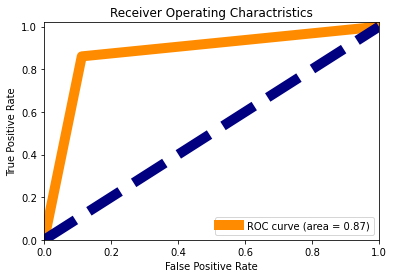

In [70]:
#Plotting AUC-ROC curve of the model

from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(pred, y_test)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr,tpr, color ='darkorange', lw=10, label ='ROC curve (area = %0.2f)'% roc_auc)
plt.plot([0,1],[0,1], color='navy', lw=10, linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Charactristics')
plt.legend(loc='lower right')
plt.show()

# SAVING THE MODEL

In [71]:
#Saving the model

import pickle
filename = 'INSURANCE.pkl'
pickle.dump(model, open(filename, 'wb'))

# CONCLUSION

In [72]:
#Printing final conclusion

a = np.array(y_test)
predicted = np.array(model.predict(x_test))
df_conclusion = pd.DataFrame({"Original":a, "Predicted":predicted}, index=range(len(a)))
df_conclusion

,Original,Predicted
0,1,1
1,1,1
2,0,0
3,0,0
4,0,0
...,...,...
372,0,0
373,0,0
374,1,1
375,0,0


In [73]:
#END